<a href="https://colab.research.google.com/github/shumshersubashgautam/TangramPyTorch-mapping-single-cell/blob/main/CellMapping_Tangram_Pytorch_Gene_Expression_Data.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!git clone https://github.com/broadinstitute/Tangram.git

Cloning into 'Tangram'...
remote: Enumerating objects: 1475, done.
remote: Counting objects: 100% (108/108), done.
remote: Compressing objects: 100% (61/61), done.
remote: Total 1475 (delta 63), reused 74 (delta 44), pack-reused 1367
Receiving objects: 100% (1475/1475), 135.93 MiB | 18.65 MiB/s, done.
Resolving deltas: 100% (846/846), done.


In [3]:
cd Tangram

/content/Tangram


In [13]:
# !pip install scanpy==1.9.3 anndata==0.9.1 umap numpy==1.22.4 scipy==1.10.1 pandas==1.5.3 scikit-learn==1.2.2 statsmodels==0.13.5 python-igraph==0.10.4 pynndescent==0.5.10 squidpy==1.1.2

In [16]:
# !pip install tangram-sc

In [18]:
# !python setup.py install

In [2]:
import scanpy as sc
import squidpy as sq
import numpy as np
import pandas as pd
from anndata import AnnData
import pathlib
import matplotlib.pyplot as plt
import matplotlib as mpl
import skimage
import seaborn as sns
import tangram as tg

sc.logging.print_header()
print(f"squidpy=={sq.__version__}")

%load_ext autoreload
%autoreload 2
%matplotlib inline

scanpy==1.9.3 anndata==0.9.1 umap==0.5.3 numpy==1.22.4 scipy==1.10.1 pandas==1.5.3 scikit-learn==1.2.2 statsmodels==0.13.5 python-igraph==0.10.4 pynndescent==0.5.10
squidpy==1.1.2


In [3]:
adata_st = sq.datasets.visium_fluo_adata_crop()
adata_st = adata_st[
    adata_st.obs.cluster.isin([f"Cortex_{i}" for i in np.arange(1, 5)])
].copy()
img = sq.datasets.visium_fluo_image_crop()

adata_sc = sq.datasets.sc_mouse_cortex()

In [4]:
adata_st.obs

,in_tissue,array_row,array_col,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,total_counts_MT,log1p_total_counts_MT,pct_counts_MT,n_counts,leiden,cluster
AAATGGCATGTCTTGT-1,1,13,69,5191,8.554874,15977.0,9.678968,20.629655,26.757213,34.743694,48.889028,0.0,0.0,0.0,15977.0,0,Cortex_1
AACAACTGGTAGTTGC-1,1,28,42,5252,8.566555,16649.0,9.720165,20.481711,26.277855,34.092138,48.201093,0.0,0.0,0.0,16649.0,0,Cortex_1
AACAGGAAATCGAATA-1,1,15,67,6320,8.751633,23375.0,10.059465,17.929412,23.850267,32.077005,45.963636,0.0,0.0,0.0,23375.0,0,Cortex_1
AACCCAGAGACGGAGA-1,1,15,39,3659,8.205218,9229.0,9.130215,25.939972,31.964460,39.885145,53.212699,0.0,0.0,0.0,9229.0,1,Cortex_2
AACCGTTGTGTTTGCT-1,1,12,64,4512,8.414717,12679.0,9.447782,21.839262,28.038489,36.209480,50.540263,0.0,0.0,0.0,12679.0,0,Cortex_1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGGATTGGGTACCAC-1,1,17,55,4980,8.513386,15381.0,9.640953,21.038944,27.059359,35.114752,49.197061,0.0,0.0,0.0,15381.0,0,Cortex_1
TTGGCTCGCATGAGAC-1,1,23,37,4620,8.438366,13193.0,9.487517,20.609414,26.445842,34.063519,48.442356,0.0,0.0,0.0,13193.0,5,Cortex_3
TTGTATCACACAGAAT-1,1,12,74,6120,8.719481,21951.0,9.996614,18.199626,24.235798,32.440436,46.663022,0.0,0.0,0.0,21951.0,0,Cortex_1
TTGTGGCCCTGACAGT-1,1,18,60,4971,8.511577,14779.0,9.601030,21.381690,27.924758,36.213546,49.780093,0.0,0.0,0.0,14779.0,0,Cortex_1


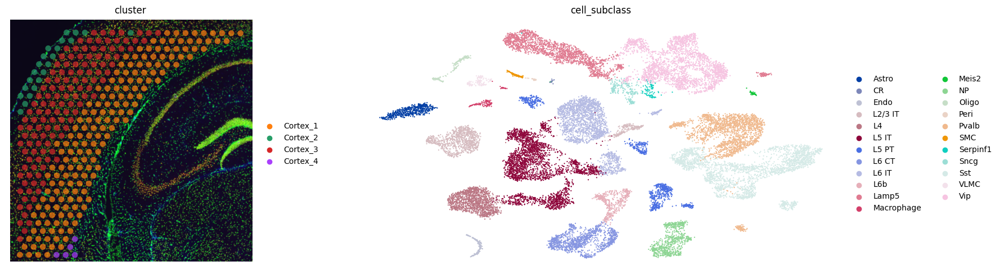

In [5]:
fig, axs = plt.subplots(1, 2, figsize=(20, 5))
sc.pl.spatial(
    adata_st, color="cluster", alpha=0.7, frameon=False, show=False, ax=axs[0]
)
sc.pl.umap(
    adata_sc, color="cell_subclass", size=10, frameon=False, show=False, ax=axs[1]
)
plt.tight_layout()

In [6]:
sc.tl.rank_genes_groups(adata_sc, groupby="cell_subclass", use_raw=False)
markers_df = pd.DataFrame(adata_sc.uns["rank_genes_groups"]["names"]).iloc[0:100, :]
markers = list(np.unique(markers_df.melt().value.values))
len(markers)

1401

In [8]:
tg.pp_adatas(adata_sc, adata_st, genes=markers)

INFO:root:1280 training genes are saved in `uns``training_genes` of both single cell and spatial Anndatas.
INFO:root:14785 overlapped genes are saved in `uns``overlap_genes` of both single cell and spatial Anndatas.
INFO:root:uniform based density prior is calculated and saved in `obs``uniform_density` of the spatial Anndata.
INFO:root:rna count based density prior is calculated and saved in `obs``rna_count_based_density` of the spatial Anndata.


In [9]:
ad_map = tg.map_cells_to_space(adata_sc, adata_st,
    mode="cells",
#     mode="clusters",
#     cluster_label='cell_subclass',  # .obs field w cell types
    density_prior='rna_count_based',
    num_epochs=100,
    #device="cuda:1",
    device='cpu',
)

INFO:root:Allocate tensors for mapping.
INFO:root:Begin training with 1280 genes and rna_count_based density_prior in cells mode...
INFO:root:Printing scores every 100 epochs.


Score: 0.613, KL reg: 0.001


INFO:root:Saving results..


In [32]:
# !wget https://developer.nvidia.com/compute/cuda/9.2/Prod/local_installers/cuda-repo-ubuntu1604-9-2-local_9.2.88-1_amd64 -O cuda-repo-ubuntu1604-9-2-local_9.2.88-1_amd64.deb
# !dpkg -i cuda-repo-ubuntu1604-9-2-local_9.2.88-1_amd64.deb
# !apt-key add /var/cuda-repo-9-2-local/7fa2af80.pub
# !apt-get update
# !apt-get install cuda

In [10]:
ad_map

AnnData object with n_obs × n_vars = 21697 × 324
    obs: 'sample_name', 'organism', 'donor_sex', 'cell_class', 'cell_subclass', 'cell_cluster', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts'
    var: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_MT', 'log1p_total_counts_MT', 'pct_counts_MT', 'n_counts', 'leiden', 'cluster', 'uniform_density', 'rna_count_based_density'
    uns: 'train_genes_df', 'training_history'

INFO:root:spatial prediction dataframe is saved in `obsm` `tangram_ct_pred` of the spatial AnnData.


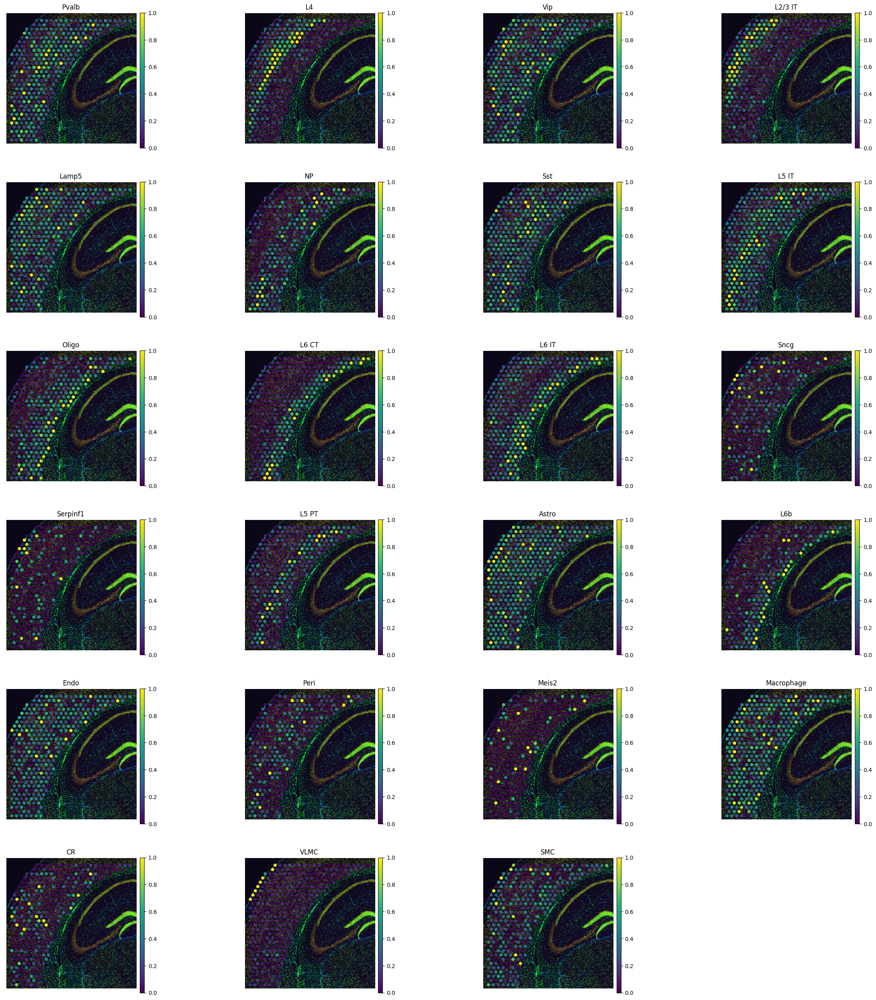

In [11]:
tg.project_cell_annotations(ad_map, adata_st, annotation="cell_subclass")
annotation_list = list(pd.unique(adata_sc.obs['cell_subclass']))
tg.plot_cell_annotation_sc(adata_st, annotation_list,perc=0.02)

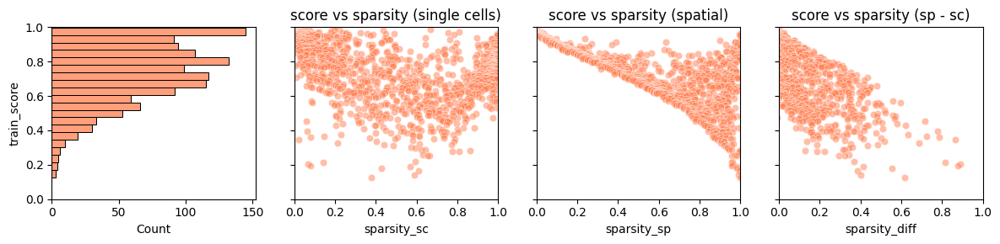

In [12]:
tg.plot_training_scores(ad_map, bins=20, alpha=.5)

In [13]:
ad_map.uns['train_genes_df']

,train_score,sparsity_sc,sparsity_sp,sparsity_diff
ppia,0.998172,0.000092,0.000000,-0.000092
ubb,0.997329,0.000092,0.000000,-0.000092
atp1b1,0.996995,0.014334,0.000000,-0.014334
tmsb4x,0.996993,0.002811,0.000000,-0.002811
ckb,0.996335,0.002765,0.000000,-0.002765
...,...,...,...,...
trpc5,0.188313,0.569203,0.981481,0.412278
cdyl2,0.177562,0.425911,0.981481,0.555570
cntnap5c,0.163585,0.608241,0.993827,0.385586
dlx1as,0.139344,0.587777,0.990741,0.402964


In [14]:
ad_ge = tg.project_genes(adata_map=ad_map, adata_sc=adata_sc)
ad_ge

AnnData object with n_obs × n_vars = 324 × 36826
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_MT', 'log1p_total_counts_MT', 'pct_counts_MT', 'n_counts', 'leiden', 'cluster', 'uniform_density', 'rna_count_based_density'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'sparsity', 'is_training'
    uns: 'cell_class_colors', 'cell_subclass_colors', 'hvg', 'neighbors', 'pca', 'umap', 'rank_genes_groups', 'training_genes', 'overlap_genes'

In [15]:
genes = ['rragb', 'trim17', 'eno1b']
ad_map.uns['train_genes_df'].loc[genes]

,train_score,sparsity_sc,sparsity_sp,sparsity_diff
rragb,0.358254,0.079919,0.867284,0.787365
trim17,0.204065,0.069641,0.959877,0.890236
eno1b,0.343546,0.022492,0.885802,0.863311


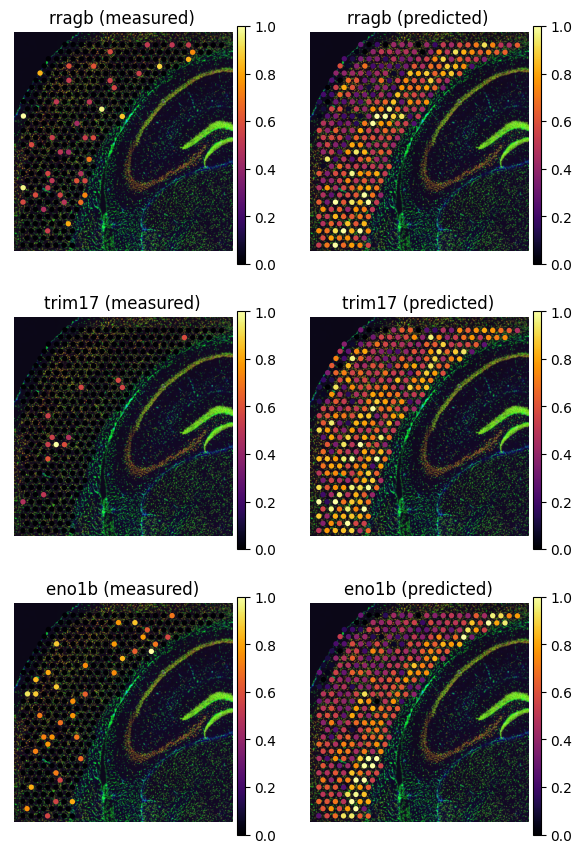

In [16]:
tg.plot_genes_sc(genes, adata_measured=adata_st, adata_predicted=ad_ge, perc=0.02)

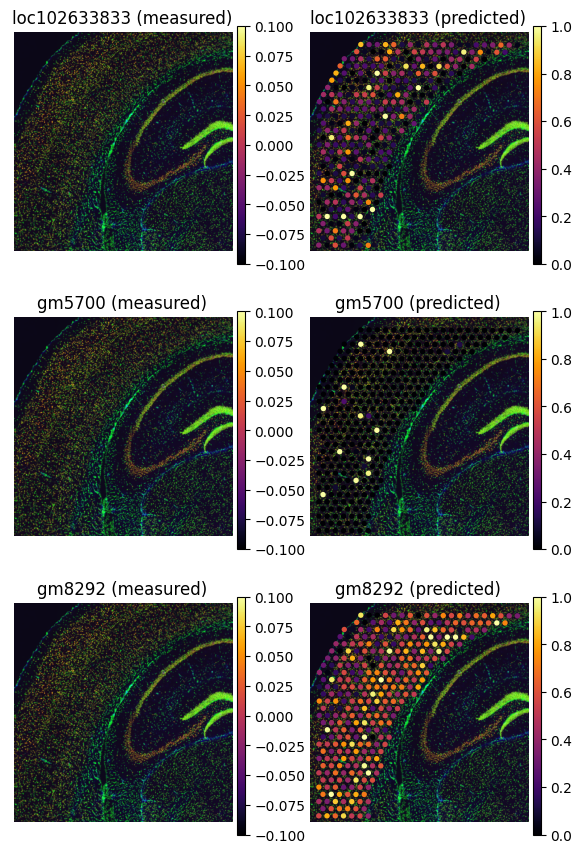

In [17]:
genes=['loc102633833', 'gm5700', 'gm8292']
tg.plot_genes_sc(genes, adata_measured=adata_st, adata_predicted=ad_ge, perc=0.02)

In [18]:
(ad_ge.var.is_training == False).sum()

35546

In [19]:
df_all_genes = tg.compare_spatial_geneexp(ad_ge, adata_st, adata_sc)
df_all_genes

,score,is_training,sparsity_sp,sparsity_sc,sparsity_diff
snap25,0.998242,False,0.000000,0.014610,-0.014610
ppia,0.998172,True,0.000000,0.000092,-0.000092
gapdh,0.998172,False,0.000000,0.000968,-0.000968
calm1,0.997953,False,0.000000,0.000369,-0.000369
calm2,0.997749,False,0.000000,0.001751,-0.001751
...,...,...,...,...,...
1810010k12rik,0.000179,False,0.996914,0.999585,-0.002672
haglr,0.000162,False,0.996914,0.999124,-0.002211
tdgf1,0.000143,False,0.996914,0.999263,-0.002349
prr32,0.000122,False,0.993827,0.999263,-0.005435


TypeError: ignored

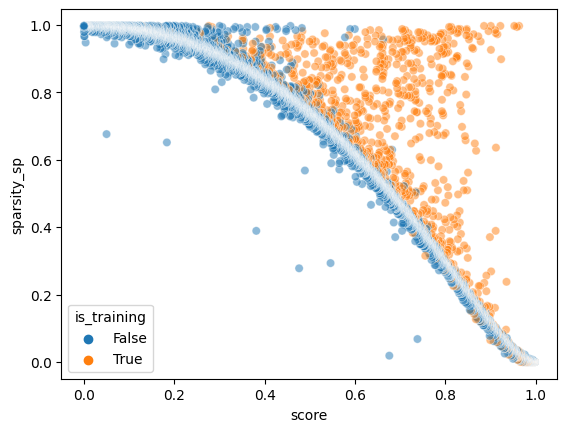

<Figure size 640x480 with 0 Axes>

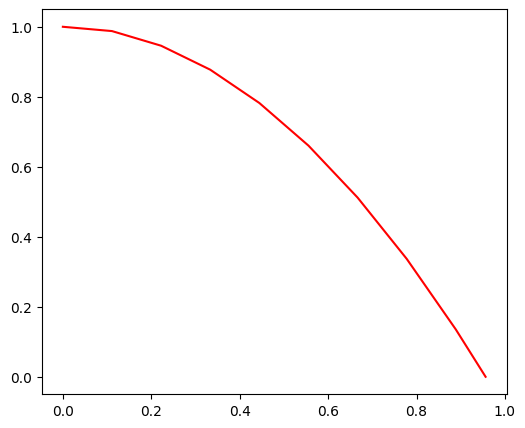

In [21]:
sns.scatterplot(data=df_all_genes, x='score', y='sparsity_sp', hue='is_training', alpha=.5);  # for legacy
tg.plot_auc(df_all_genes);

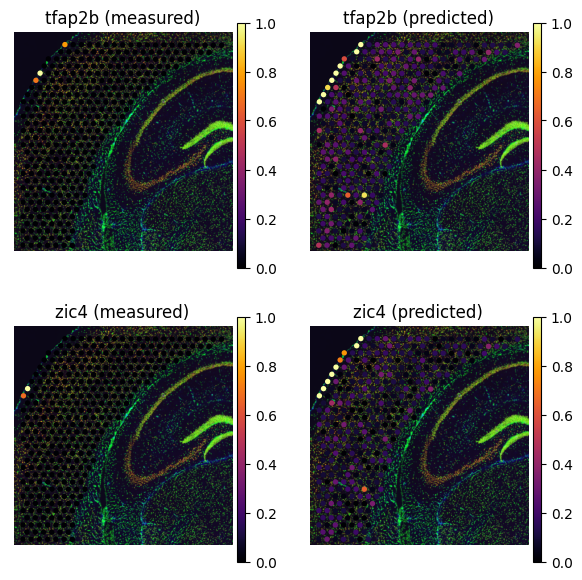

In [22]:
genes=['tfap2b', 'zic4']
tg.plot_genes_sc(genes, adata_measured=adata_st, adata_predicted=ad_ge, perc=0.02)

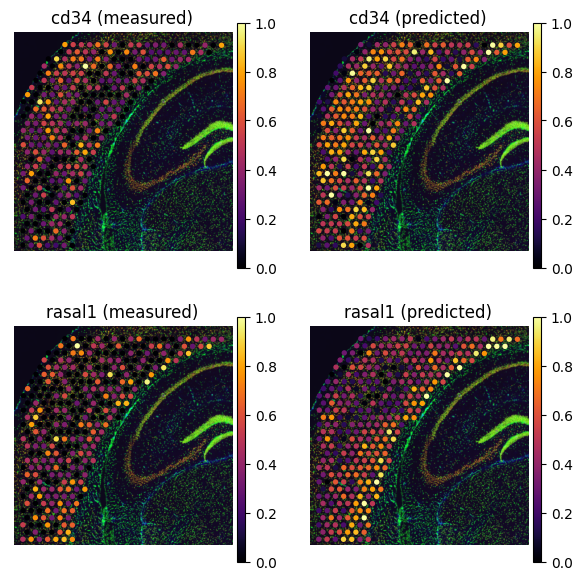

In [23]:
genes = ['cd34', 'rasal1']
tg.plot_genes_sc(genes, adata_measured=adata_st, adata_predicted=ad_ge, perc=0.02)

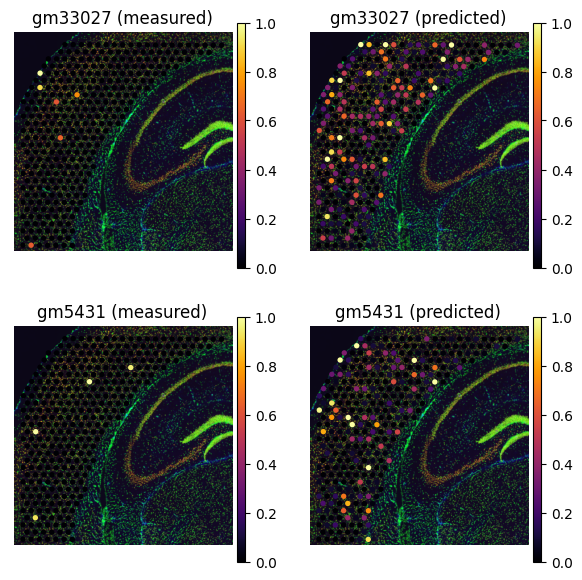

In [24]:
genes = ['gm33027', 'gm5431']
tg.plot_genes_sc(genes[:5], adata_measured=adata_st, adata_predicted=ad_ge, perc=0.02)

In [25]:
sq.im.process(img=img, layer="image", method="smooth")
sq.im.segment(
    img=img,
    layer="image_smooth",
    method="watershed",
    channel=0,
)

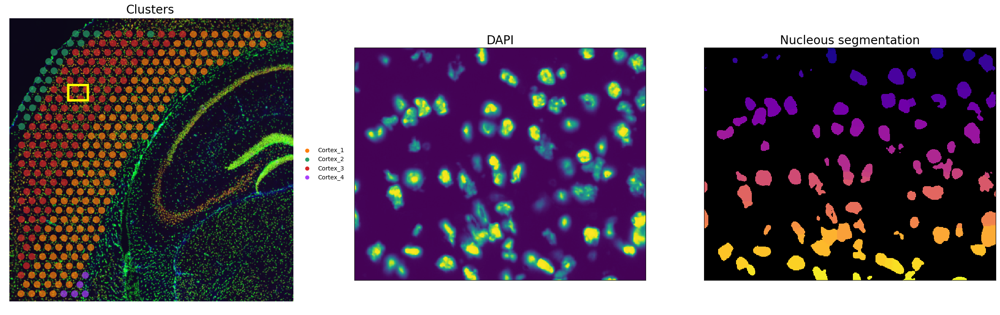

In [26]:
inset_y = 1500
inset_x = 1700
inset_sy = 400
inset_sx = 500

fig, axs = plt.subplots(1, 3, figsize=(30, 10))
sc.pl.spatial(
    adata_st, color="cluster", alpha=0.7, frameon=False, show=False, ax=axs[0], title=""
)
axs[0].set_title("Clusters", fontdict={"fontsize": 20})
sf = adata_st.uns["spatial"]["V1_Adult_Mouse_Brain_Coronal_Section_2"]["scalefactors"][
    "tissue_hires_scalef"
]
rect = mpl.patches.Rectangle(
    (inset_y * sf, inset_x * sf),
    width=inset_sx * sf,
    height=inset_sy * sf,
    ec="yellow",
    lw=4,
    fill=False,
)
axs[0].add_patch(rect)

axs[0].axes.xaxis.label.set_visible(False)
axs[0].axes.yaxis.label.set_visible(False)

axs[1].imshow(
    img["image"][inset_y : inset_y + inset_sy, inset_x : inset_x + inset_sx, 0, 0]
    / 65536,
    interpolation="none",
)
axs[1].grid(False)
axs[1].set_xticks([])
axs[1].set_yticks([])
axs[1].set_title("DAPI", fontdict={"fontsize": 20})

crop = img["segmented_watershed"][
    inset_y : inset_y + inset_sy, inset_x : inset_x + inset_sx
].values.squeeze(-1)
crop = skimage.segmentation.relabel_sequential(crop)[0]
cmap = plt.cm.plasma
cmap.set_under(color="black")
axs[2].imshow(crop, interpolation="none", cmap=cmap, vmin=0.001)
axs[2].grid(False)
axs[2].set_xticks([])
axs[2].set_yticks([])
axs[2].set_title("Nucleous segmentation", fontdict={"fontsize": 20});

In [27]:
# define image layer to use for segmentation
features_kwargs = {
    "segmentation": {
        "label_layer": "segmented_watershed",
        "props": ["label", "centroid"],
        "channels": [1, 2],
    }
}
# calculate segmentation features
sq.im.calculate_image_features(
    adata_st,
    img,
    layer="image",
    key_added="image_features",
    features_kwargs=features_kwargs,
    features="segmentation",
    mask_circle=True,
)

  0%|          | 0/324 [00:00<?, ?/s]

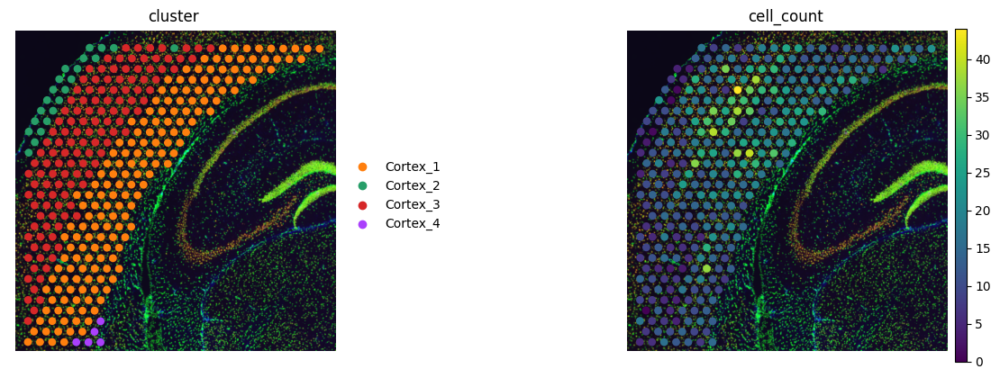

In [28]:
adata_st.obs["cell_count"] = adata_st.obsm["image_features"]["segmentation_label"]
sc.pl.spatial(adata_st, color=["cluster", "cell_count"], frameon=False)

In [29]:
ad_map = tg.map_cells_to_space(
    adata_sc,
    adata_st,
    mode="constrained",
    target_count=adata_st.obs.cell_count.sum(),
    density_prior=np.array(adata_st.obs.cell_count) / adata_st.obs.cell_count.sum(),
    num_epochs=200,
#     device="cuda:0",
    device='cpu',
)

Score: 0.613, KL reg: 0.125, Count reg: 5729.088, Lambda f reg: 4485.579
Score: 0.697, KL reg: 0.012, Count reg: 3.319, Lambda f reg: 725.891


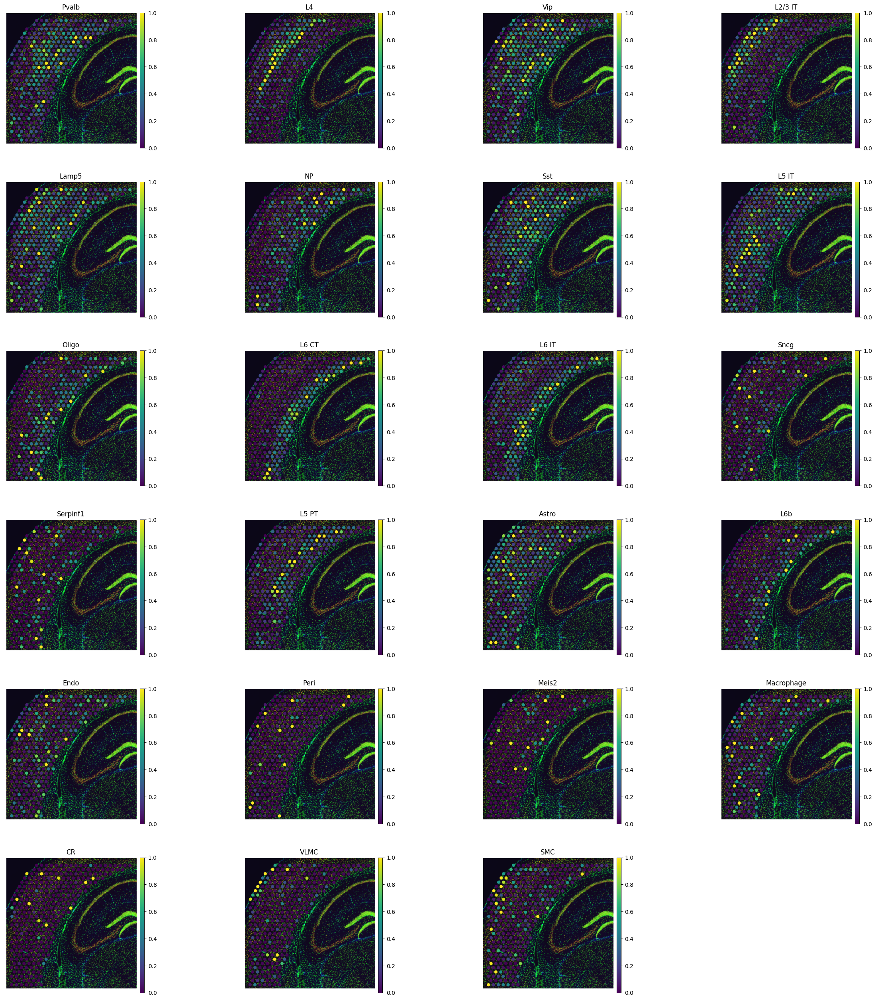

In [30]:
tg.project_cell_annotations(ad_map, adata_st, annotation="cell_subclass")
annotation_list = list(pd.unique(adata_sc.obs['cell_subclass']))
tg.plot_cell_annotation_sc(adata_st, annotation_list, perc=0.02)

In [ ]:
ad_ge = tg.project_genes(adata_map=ad_map, adata_sc=adata_sc)
df_all_genes = tg.compare_spatial_geneexp(ad_ge, adata_st, adata_sc)
tg.plot_auc(df_all_genes);

In [ ]:
tg.create_segment_cell_df(adata_st)
adata_st.uns["tangram_cell_segmentation"].head()